# Metrics Investigation (PRECT)


In [6]:
# Add ldcpy root to system path
import sys

import astropy

sys.path.insert(0, '/Users/alex/git/ldcpy')

# Import ldcpy package
# Autoreloads package everytime the package is called, so changes to code will be reflected in the notebook if the above sys.path.insert(...) line is uncommented.
%load_ext autoreload
%autoreload 2

# suppress all of the divide by zero warnings
import warnings

warnings.filterwarnings("ignore")

import ldcpy

# display the plots in this notebook
%matplotlib inline

In [7]:
sys.path

['/Users/alex/git/ldcpy',
 '/Users/alex/git/lcr/notebooks',
 '/opt/miniconda3/envs/ldcpy_a/lib/python38.zip',
 '/opt/miniconda3/envs/ldcpy_a/lib/python3.8',
 '/opt/miniconda3/envs/ldcpy_a/lib/python3.8/lib-dynload',
 '',
 '/Users/alex/.local/lib/python3.8/site-packages',
 '/opt/miniconda3/envs/ldcpy_a/lib/python3.8/site-packages']

In [8]:
p = '/Users/alex/git/ldcpy'

# col_ts is a collection containing TS data
col_ts = ldcpy.open_datasets(
    "cam-fv",
    ["TS"],
    [
        f"{p}/data/cam-fv/orig.TS.100days.nc",
        f"{p}/data/cam-fv/zfp1.0.TS.100days.nc",
        f"{p}/data/cam-fv/zfp1e-1.TS.100days.nc",
    ],
    ["orig", "zfpA1.0", "zfpA1e-1"],
)
# col_prect contains PRECT data
col_prect = ldcpy.open_datasets(
    "cam-fv",
    ["PRECT"],
    [
        f"{p}/data/cam-fv/orig.PRECT.60days.nc",
        f"{p}/data/cam-fv/zfp1e-7.PRECT.60days.nc",
        f"{p}/data/cam-fv/zfp1e-11.PRECT.60days.nc",
    ],
    ["orig", "zfpA1e-7", "zfpA1e-11"],
)
# col_t contains 3D T data (here we specify the chunk to be a single timeslice)
col_t = ldcpy.open_datasets(
    "cam-fv",
    ["T"],
    [
        f"{p}/data/cam-fv/cam-fv.T.3months.nc",
        f"{p}/data/cam-fv/c.fpzip.cam-fv.T.3months.nc",
    ],
    ["orig", "comp"],
    chunks={"time": 1},
)

dataset size in GB 0.07

dataset size in GB 0.04

dataset size in GB 0.04



### Summary of results:

The purpose of this notebook is to make (known) perturbations to the datasets and examine which of the four metrics (ks p-value, spatial relative error, pearson correlation coefficient, and DSSIM) are effective at catching each change to the data. In particular, we are interested in situations where the DSSIM is not effective at capturing the changes but the other metrics are able to.

We start by comparing the original data to the compressed data at two compression levels. In the case of more aggressive compression (in this case, zfpA1e-7), we find that all four metrics indicate evidence of compression. For the less compressed dataset, only the ks and spatial relative error tests are able to pick up evidence of compression. From this it is clear that the metrics are capturing different types of compression artifacts. The remaining sections consist of perturbing the dataset in a controlled way and examining which, if any, of the metric tests are able to detect evidence of compression.

Section 1: Noise

In this section we add increasing levels of noise to the data, from 0.00001% up to 0.00076%. The idea is that the data will look the same up to some level of noise, but this perturbation may be caught more quickly by other metrics besides the DSSIM. Indeed, the Kolmogorov-Smirnov test fails very quickly in the presence of added noise, and the spatial relative error is also very sensitive in this case, because of the presence of a large number of values that are close to zero. This suggests that at least one of these two metrics is important to include in our final metric suite.

Section 2: Reversed Comparison

In the case where something is wrong with the compression and the resulting data is flipped along an axis, we want our metrics to catch this situation. Indeed, we find that every one of our metrics is sensitive to flipping the data along its axis.

Section 3: Single Altered Point

We previously encountered a situation where a single incorrectly compressed data point in the corner of the image was not captured by the DSSIM, but only by the pearson correlation coefficient. It turns out that the sensitivity of the DSSIM to this type of error depends on the location and magnitude of the error in the dataset. Because the corner point is only included in a single DSSIM calculation which is averaged across the entire rest of the dataset, that error does not affect the DSSIM enough to fall below the threshold (it will if a large error occurs in the middle of the dataset, however. We find that the pearson correlation coefficient is sensitive to changes of this type as it greatly affects the mean of the data and causes the correlation between the original and altered data to become nearly zero. For this reason we choose to include the Pearson correlation coefficient in our metric suite. Note, however, that the ability of the Pearson correlation coefficient to catch these errors depends on the magnitude of the errors, increasing a single value by more than 20% in the TS variable is sufficient for the test to work, and increasing a value in the PRECT variable from 2e-13 to more than 4e-7 is sufficient for the test to work correctly.

Section 4: Small Addition Comparison

Next we added a small amount to every point in the dataset. Because the PRECT variable contains many values that are already small or zero, adding a small constant immediately sets off the spatial relative error and pearson-correlation coefficient tests, as well as the DSSIM. In the case of TS, adding a small enough amount to not exceed the spatial relative error cutoff is a change that only the DSSIM is capable of picking up. To summarize, the DSSIM is sensitive to this type of change, but for certain types of datasets with very small values, the ks test and spatial relative error are once again more effective at picking up the changes.

Section 5: Small region altered

In this section I altered a small region on the map over water by adding a small amount (0.0011% of the original value) to each point (smoother values apparently affect the ks test less). In this way I set off just the spatial relative error test but not any of the other tests. It is unclear to me whether this is too much of an edge case, as adding a smaller amount makes it impossible to capture using any of our metric and adding a larger value makes the ks test sensitive enough to pick up the errors when applied to at least 5% of the dataset. This is the strongest argument for inclusion of the spatial relative error test in this notebook. However, another notebook looking at metric comparison for various compression levels identifies cases where only the spatial relative error test is off and no others - but it is unclear what element of the compression led to this behavior.

Section 6: Type Conversion

In short, converting the datasets to a different datatype with more resolution (eg. float32 -> double) leaves the dataset identical and all metrics pass. Converting to a datatype such as float16 degrades the compression enough to fail every metric except possibly the pearson correlation coefficient (in the case of TS), while converting to int or unsigned int perform even more poorly, as we would hope.

Section 7: Set small values to zero (or set nearby values to a constant)

This section is in progress. Setting the smallest TS values (found by multiplying the minimum value by something just larger than one) sets off the DSSIM and pearson tests, however this is less useful than setting small values to zero as in the case of PRECT. However, the number of small values is very large and I am running into a dask issue trying to conditionally select 

Additional - argument for ks - try adding/rounding a small amount to something in the middle of the distribution (Not around zero) spatial relative error won't pick it up but ks test might.

In [9]:
ds = col_prect.isel(time=0)

# Compression Comparison (Visuals and Metrics)


In [10]:
# without weighted means
ldcpy.compare_stats(ds, "PRECT", ["orig", "zfpA1e-7", "zfpA1e-11"], significant_digits=6, weighted=False)

,orig,zfpA1e-7,zfpA1e-11
mean,2.30521e-08,2.29931e-08,2.30521e-08
variance,4.61809e-15,4.63595e-15,4.61809e-15
standard deviation,6.79572e-08,6.80884e-08,6.79572e-08
min value,-5.74342e-22,-1.86265e-08,-2.33058e-12
max value,1.18318e-06,1.16951e-06,1.18318e-06
probability positive,0.947609,0.478823,0.799515
number of zeros,2846,23842,4909
spatial autocorr - latitude,0.816319,0.814864,0.816319
spatial autocorr - longitude,0.85036,0.848766,0.85036
entropy estimate,0.530235,0.116362,0.365571


,zfpA1e-7,zfpA1e-11
max abs diff,2.18623e-08,2.82439e-12
min abs diff,0,0
mean abs diff,2.28806e-09,4.5562e-13
mean squared diff,3.48445e-21,7.24148e-31
root mean squared diff,3.66823e-09,6.00706e-13
normalized root mean squared diff,0.00310032,5.07707e-07
normalized max pointwise error,0.0166034,2.38713e-06
pearson correlation coefficient,0.998548,1
ks p-value,0,0
spatial relative error(% > 0.0001),94.8116,59.6372


2.3052133169208565e-08
2.2993103980466172e-08
2.3052132318239443e-08


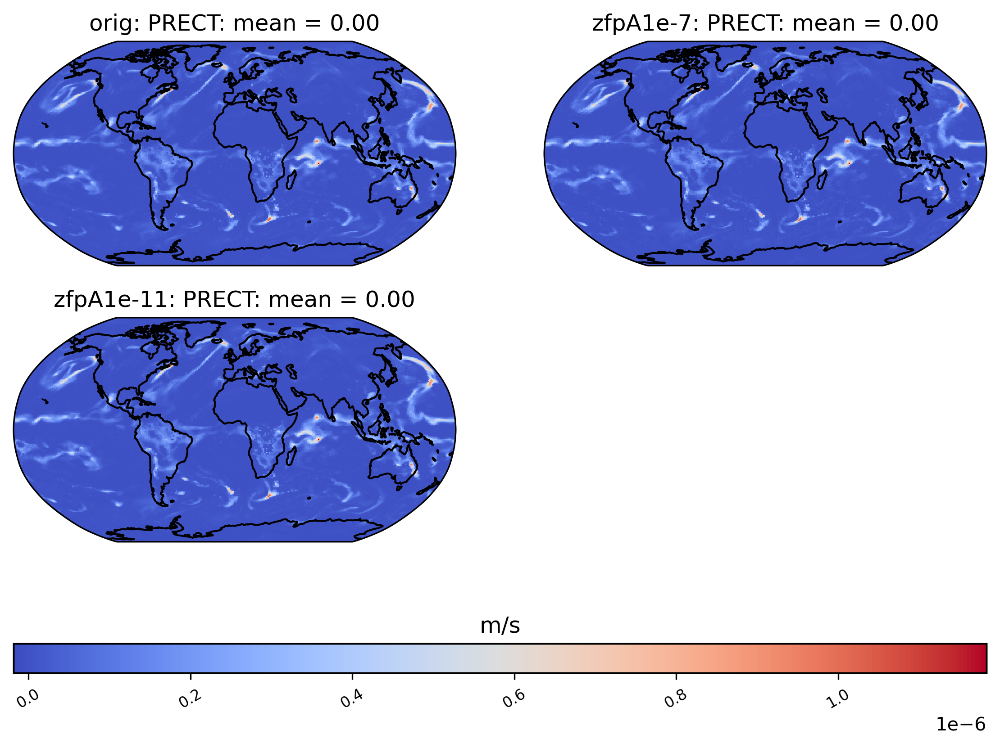

In [11]:
ds = ds.expand_dims(dim="time")
ldcpy.plot(ds, "PRECT", sets=["orig", "zfpA1e-7", "zfpA1e-11"], calc="mean", weighted=False)

In [17]:
import numpy as np
np.logspace(-5, -1, num=18)

array([1.00000000e-05, 1.71907220e-05, 2.95520924e-05, 5.08021805e-05,
       8.73326162e-05, 1.50131073e-04, 2.58086154e-04, 4.43668733e-04,
       7.62698586e-04, 1.31113394e-03, 2.25393390e-03, 3.87467512e-03,
       6.66084629e-03, 1.14504757e-02, 1.96841945e-02, 3.38385515e-02,
       5.81709133e-02, 1.00000000e-01])

# Noise Comparison (Visuals and Metrics)


In [13]:
import numpy as np
scale = np.logspace(-5, -1, num=18)

noise1 = np.random.normal(0, ds.sel(collection="orig").std().compute()["PRECT"] * scale[0], [192,288])
noise_1 = ds.sel(collection="orig") + noise1
#noise_1 = noise_1.expand_dims(dim="time")

noise2 = np.random.normal(0, ds.sel(collection="orig").std().compute()["PRECT"] * scale[1], [192,288])
noise_2 = ds.sel(collection="orig") + noise2
#noise_2 = noise_2.expand_dims(dim="time")

noise3 = np.random.normal(0, ds.sel(collection="orig").std().compute()["PRECT"] * scale[2], [192,288])
noise_3 = ds.sel(collection="orig") + noise3
#noise_3 = noise_3.expand_dims(dim="time")

noise4 = np.random.normal(0, ds.sel(collection="orig").std().compute()["PRECT"] * scale[3], [192,288])
noise_4 = ds.sel(collection="orig") + noise4
#noise_4 = noise_4.expand_dims(dim="time")

noise5 = np.random.normal(0, ds.sel(collection="orig").std().compute()["PRECT"] * scale[4], [192,288])
noise_5 = ds.sel(collection="orig") + noise5
#noise_5 = noise_5.expand_dims(dim="time")

noise6 = np.random.normal(0, ds.sel(collection="orig").std().compute()["PRECT"] * scale[5], [192,288])
noise_6 = ds.sel(collection="orig") + noise6
#noise_6 = noise_6.expand_dims(dim="time")

noise7 = np.random.normal(0, ds.sel(collection="orig").std().compute()["PRECT"] * scale[6], [192,288])
noise_7 = ds.sel(collection="orig") + noise7
#noise_7 = noise_7.expand_dims(dim="time")

noise8 = np.random.normal(0, ds.sel(collection="orig").std().compute()["PRECT"] * scale[7], [192,288])
noise_8 = ds.sel(collection="orig") + noise8
#noise_8 = noise_8.expand_dims(dim="time")

noise9 = np.random.normal(0, ds.sel(collection="orig").std().compute()["PRECT"] * scale[8], [192,288])
noise_9 = ds.sel(collection="orig") + noise9
#noise_9 = noise_9.expand_dims(dim="time")

noise_ds = ldcpy.collect_datasets("cam-fv", 
                                  ["PRECT"], 
                                  [ds.sel(collection="orig"), noise_1, noise_2, noise_3, noise_4, noise_5, noise_6, noise_7, noise_8, noise_9],
                                  ["orig", "noise_1", "noise_2", "noise_3", "noise_4", "noise_5", "noise_6", "noise_7", "noise_8", "noise_9"])
noise_ds.attrs["file_size"] = None

dataset size in GB 0.00



In [14]:
# without weighted means
ldcpy.compare_stats(noise_ds, "PRECT", ["orig", "noise_1", "noise_2",
                                     "noise_3", "noise_4", "noise_5",
                                     "noise_6", "noise_7", "noise_8",
                                     "noise_9"], significant_digits=6, weighted=False)

Warning - this data set has a time dimension - examining slice 0 only...


,orig,noise_1,noise_2,noise_3,noise_4,noise_5,noise_6,noise_7,noise_8,noise_9
mean,2.30521e-08,2.30521e-08,2.30521e-08,2.30521e-08,2.30521e-08,2.30522e-08,2.30521e-08,2.30521e-08,2.30523e-08,2.30521e-08
variance,4.61809e-15,4.61809e-15,4.61809e-15,4.6181e-15,4.61809e-15,4.6181e-15,4.61809e-15,4.6181e-15,4.6181e-15,4.6181e-15
standard deviation,6.79572e-08,6.79572e-08,6.79572e-08,6.79572e-08,6.79572e-08,6.79572e-08,6.79571e-08,6.79572e-08,6.79572e-08,6.79572e-08
min value,-5.74342e-22,-2.7337e-12,-4.47307e-12,-7.42125e-12,-1.34713e-11,-2.36604e-11,-3.98592e-11,-6.30248e-11,-1.23646e-10,-2.17935e-10
max value,1.18318e-06,1.18318e-06,1.18318e-06,1.18318e-06,1.18318e-06,1.18318e-06,1.1832e-06,1.18317e-06,1.18313e-06,1.18323e-06
probability positive,0.947609,0.84281,0.842972,0.836173,0.835196,0.830295,0.825792,0.819463,0.813169,0.805556
number of zeros,2846,0,0,0,0,0,0,0,0,0
spatial autocorr - latitude,0.816319,0.816319,0.816319,0.816319,0.816319,0.816319,0.816319,0.816318,0.816321,0.816317
spatial autocorr - longitude,0.85036,0.85036,0.850359,0.850359,0.85036,0.850359,0.85036,0.850358,0.850359,0.850357
entropy estimate,0.530235,0.963035,0.963042,0.963214,0.963505,0.963702,0.963779,0.963856,0.963901,0.964055


,noise_1,noise_2,noise_3,noise_4,noise_5,noise_6,noise_7,noise_8,noise_9
max abs diff,2.73372e-12,4.91063e-12,8.71983e-12,1.35015e-11,2.6414e-11,4.41997e-11,7.17693e-11,1.27835e-10,2.17935e-10
min abs diff,6.01581e-18,6.90051e-17,6.88037e-17,9.23269e-17,1.209e-16,7.68486e-16,2.55813e-16,6.74706e-16,5.56941e-16
mean abs diff,5.47462e-13,9.34653e-13,1.59072e-12,2.75728e-12,4.72594e-12,8.1392e-12,1.39021e-11,2.4093e-11,4.15413e-11
mean squared diff,3.2907e-30,7.98538e-29,8.07673e-29,3.6928e-29,4.17038e-28,1.71976e-28,2.48322e-29,2.21641e-26,5.14716e-29
root mean squared diff,6.85754e-13,1.17002e-12,1.99647e-12,3.45625e-12,5.92256e-12,1.0191e-11,1.74186e-11,3.02101e-11,5.20947e-11
normalized root mean squared diff,5.79587e-07,9.8888e-07,1.68738e-06,2.92117e-06,5.00565e-06,8.61325e-06,1.47219e-05,2.5533e-05,4.40295e-05
normalized max pointwise error,2.3105e-06,4.15038e-06,6.70083e-06,1.14112e-05,2.23247e-05,3.73568e-05,6.06582e-05,0.000104503,0.000184195
pearson correlation coefficient,1,1,1,1,1,1,1,1,1
ks p-value,0,0,0,0,0,0,0,0,0
spatial relative error(% > 0.0001),60.5867,65.0246,69.6814,74.3978,78.7977,82.9102,86.6175,89.4278,91.4569


2.3052133169208565e-08
2.3052131355180836e-08
2.3052142105303727e-08
2.3052124182144377e-08
2.3052139246045897e-08
2.3052153590714143e-08
2.305214628315702e-08
2.3052128186012615e-08
2.3052282045273756e-08
2.305212599484007e-08


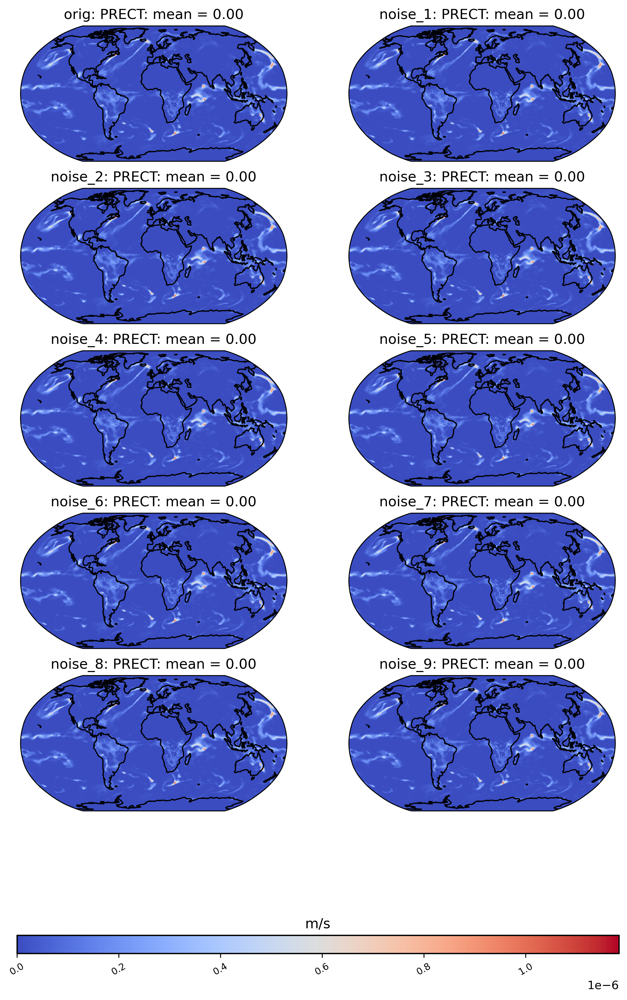

In [15]:
# without weighted means
ldcpy.plot(noise_ds, "PRECT", sets=["orig", "noise_1", "noise_2",
                                     "noise_3", "noise_4", "noise_5",
                                     "noise_6", "noise_7", "noise_8",
                                     "noise_9"], calc="mean", weighted=False)

In [16]:
# da = ds.sel(collection="orig")#.expand_dims(dim="time")
# reverse_lat_da = da
# reverse_lat_da["lat"] = da.lat[::-1]

# reverse_lon_da = da
# reverse_lon_da["lon"] = da.lon[::-1]

# reverse_lat_lon_da = da
# reverse_lat_lon_da["lon"] = da.lon[::-1]
# reverse_lat_lon_da["lat"] = da.lat[::-1]

# reverse_ds = ldcpy.collect_datasets("cam-fv", ["TS"],
#                        [da, reverse_lat_da, reverse_lon_da, reverse_lat_lon_da],
#                                   ["orig", "reverse_lat", "reverse_lon", "reverse_lat_lon"])
# reverse_ds.attrs["file_size"] = None

# Reversed Comparison (Visuals and Metrics)


In [12]:
da = ds.sel(collection="orig")#.expand_dims(dim="time")
reverse_lat_da = da.copy()
reverse_lat_da["lat"] = da.lat[::-1]


reverse_ds = ldcpy.collect_datasets("cam-fv", ["PRECT"],
                       [da, reverse_lat_da],
                                  ["orig", "reverse_lat"])
reverse_ds.attrs["file_size"] = None

dataset size in GB 0.00



In [13]:
# without weighted means
ldcpy.compare_stats(reverse_ds, "PRECT", ["orig", "reverse_lat"], significant_digits=6, weighted=False)

Warning - this data set has a time dimension - examining slice 0 only...


,orig,reverse_lat
mean,2.30521e-08,2.30521e-08
variance,4.61809e-15,4.61809e-15
standard deviation,6.79572e-08,6.79572e-08
min value,-5.74342e-22,-5.74342e-22
max value,1.18318e-06,1.18318e-06
probability positive,0.947609,0.947609
number of zeros,2846,2846
spatial autocorr - latitude,0.816319,0.816319
spatial autocorr - longitude,0.85036,0.85036
entropy estimate,0.530235,0.529928


,reverse_lat
max abs diff,1.12776e-06
min abs diff,0
mean abs diff,3.63714e-08
mean squared diff,1.35156e-49
root mean squared diff,9.02488e-08
normalized root mean squared diff,0.0762767
normalized max pointwise error,0.95316
pearson correlation coefficient,0.11816
ks p-value,1
spatial relative error(% > 0.0001),94.8532


2.3052133169208565e-08
2.3052133169208565e-08


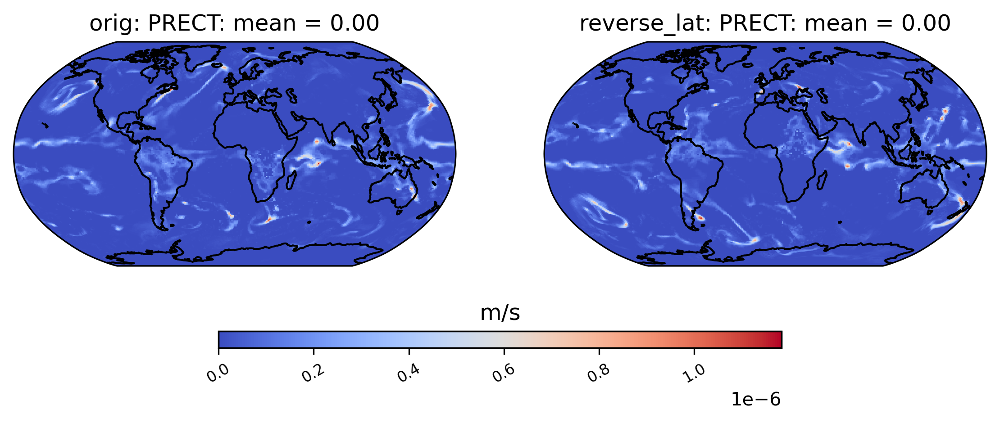

In [14]:
ldcpy.plot(reverse_ds, "PRECT", sets=["orig", "reverse_lat"], calc="mean", weighted=False)

# Single Point Altered Comparison (Visuals and Metrics)


In [46]:
import xarray as xr
import numpy as np
import dask
da = ds.sel(collection="orig")["PRECT"]

point_altered_da = da.copy().load()
print(point_altered_da[0,0,0].values)
point_altered_da[0,0,0] = 1000000


point_altered_da3 = da.copy().load()
point_altered_da3[0,0,0] = 4e-7


point_altered_da2 = da.copy().load()
point_altered_da2[0,10,10] = 1000000


2.2210726e-13


In [47]:
da = ds.sel(collection="orig")
altered_ds = ldcpy.collect_datasets("cam-fv", ["PRECT"],
                       [da, point_altered_da.to_dataset(), point_altered_da2.to_dataset(),
                       point_altered_da3.to_dataset()],
                                  ["orig", "altered", "altered2", "altered3"])
altered_ds.attrs["file_size"] = None

dataset size in GB 0.00



In [48]:
# without weighted means
ldcpy.compare_stats(altered_ds, "PRECT", ["orig", "altered", "altered2", "altered3"], significant_digits=6, weighted=False)

Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2,altered3
mean,2.30521e-08,18.0845,18.0845,2.30594e-08
variance,4.61809e-15,1.80842e+07,1.80842e+07,4.62065e-15
standard deviation,6.79572e-08,4252.59,4252.59,6.7976e-08
min value,-5.74342e-22,-5.74342e-22,-5.74342e-22,-5.74342e-22
max value,1.18318e-06,1e+06,1e+06,1.18318e-06
probability positive,0.947609,0.947609,0.947609,0.947609
number of zeros,2846,2846,2846,2846
spatial autocorr - latitude,0.816319,-0.00145056,-1.81795e-05,0.816057
spatial autocorr - longitude,0.85036,-1.80848e-05,-1.80848e-05,0.849816
entropy estimate,0.530235,0.530249,0.530237,0.530244


,altered,altered2,altered3
max abs diff,1e+06,1e+06,4e-07
min abs diff,0,0,0
mean abs diff,18.0845,18.0845,7.23379e-12
mean squared diff,327.049,327.049,5.23278e-23
root mean squared diff,4252.59,4252.59,1.70103e-09
normalized root mean squared diff,3.59421e+09,3.59421e+09,0.00143768
normalized max pointwise error,0,0,0
pearson correlation coefficient,-0.00144256,-0.00144249,0.999687
ks p-value,1,1,1
spatial relative error(% > 0.0001),0.00180845,0.00180845,0.00180845


2.3052133169208565e-08
18.084490763792868
18.084490763792868
0.005284495800218474


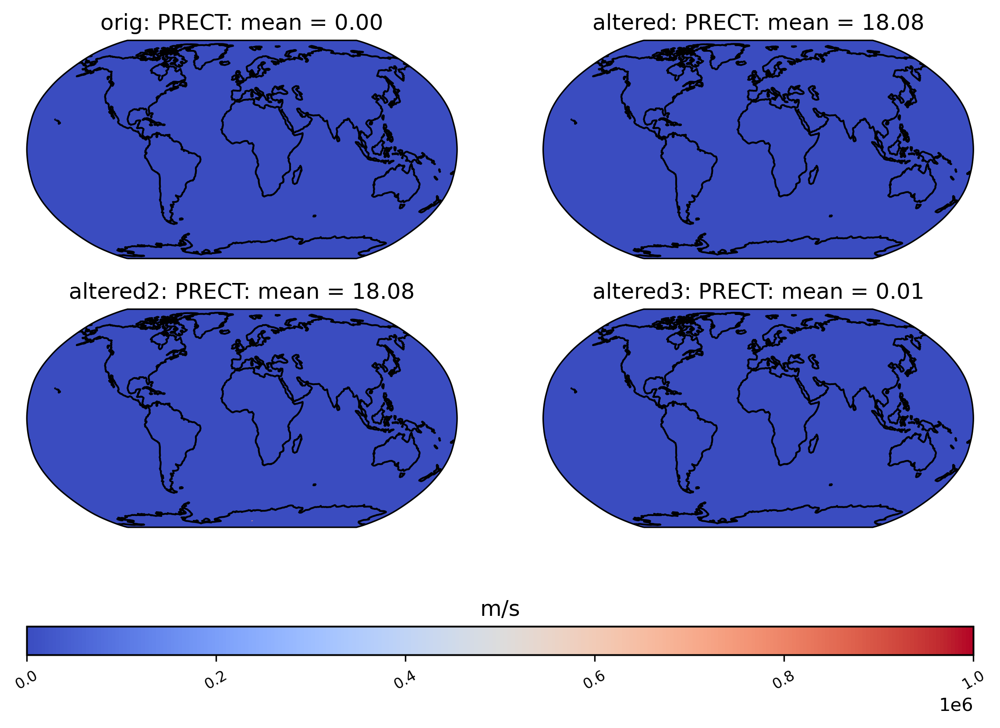

In [24]:
ldcpy.plot(altered_ds, "PRECT", sets=["orig", "altered", "altered2", "altered3"], calc="mean", weighted=False)



# Small Addition Comparison (Visuals and Metrics)


dataset size in GB 0.00

Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2
mean,2.30521e-08,1,2.31113e-08
variance,4.61809e-15,4.93173e-15,4.61809e-15
standard deviation,6.79572e-08,7.02269e-08,6.79572e-08
min value,-5.74342e-22,1,5.91588e-11
max value,1.18318e-06,1,1.18324e-06
probability positive,0.947609,1,1
number of zeros,2846,0,0
spatial autocorr - latitude,0.816319,0.777033,0.816319
spatial autocorr - longitude,0.85036,0.812349,0.85036
entropy estimate,0.530235,0.0114565,0.442218


,altered,altered2
max abs diff,1,5.9174e-11
min abs diff,1,5.91172e-11
mean abs diff,1,5.91588e-11
mean squared diff,1,3.49976e-21
root mean squared diff,1,5.91588e-11
normalized root mean squared diff,845182,5e-05
normalized max pointwise error,845182,4.99648e-05
pearson correlation coefficient,0.972946,1
ks p-value,0,0
spatial relative error(% > 0.0001),100,94.6018


2.3052133169208565e-08
1.000000019424112
2.311129196723287e-08


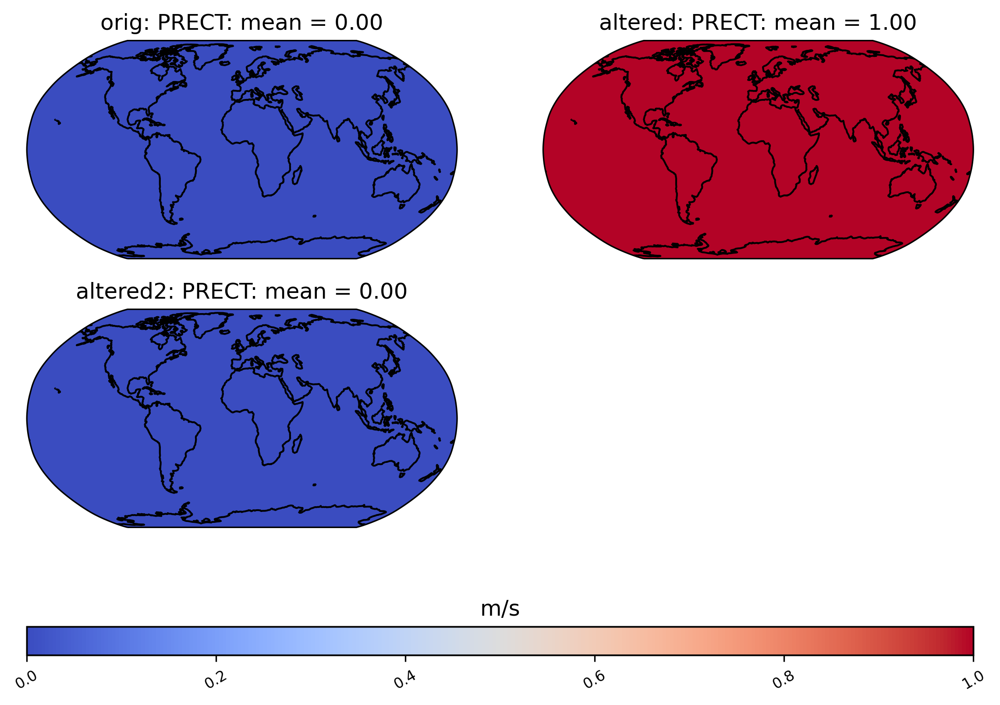

In [49]:
import xarray as xr
import numpy as np
import dask
da = ds.sel(collection="orig")["PRECT"]

point_altered_da = da.copy().load()
point_altered_da[:,:,:] = point_altered_da[:,:,:] + 1


point_altered_da2 = da.copy().load()
point_altered_da2[:,:,:] = point_altered_da2[:,:,:] + (np.max(point_altered_da2[:,:,:]) * 0.00005)

da = ds.sel(collection="orig")
altered_ds = ldcpy.collect_datasets("cam-fv", ["PRECT"],
                       [da, point_altered_da.to_dataset(), point_altered_da2.to_dataset()],
                                  ["orig", "altered", "altered2"])
altered_ds.attrs["file_size"] = None

# without weighted means
ldcpy.compare_stats(altered_ds, "PRECT", ["orig", "altered", "altered2"], significant_digits=6, weighted=False)

ldcpy.plot(altered_ds, "PRECT", sets=["orig", "altered", "altered2"], calc="mean", weighted=False)

# Small Region Altered Comparison (Visuals and Metrics)


In [50]:
import xarray as xr
import numpy as np
import dask
da = ds.sel(collection="orig")["PRECT"]

point_altered_da = da.copy().load()
point_altered_da[:,20:100:,20:60] = point_altered_da[:,20:100:,20:60] + (point_altered_da[:,20:100:,20:60] * .00005)


point_altered_da2 = da.copy().load()
point_altered_da2[:,20:100:,20:60] = point_altered_da2[:,20:100:,20:60] + (point_altered_da2[:,20:100:,20:60] * .00011)



point_altered_da3 = da.copy().load()
point_altered_da3[:,20:100:,20:60] = point_altered_da3[:,20:100:,20:60] + (point_altered_da3[:,20:100:,20:60] * .0002)


point_altered_da4 = da.copy().load()
point_altered_da4[:,20:100:,20:60] = point_altered_da4[:,20:100:,20:60] + (point_altered_da4[:,20:100:,20:60] * 1)


point_altered_da5 = da.copy().load()
point_altered_da5[:,30:70,250:287] = point_altered_da5[:,30:70,250:287] + (point_altered_da5[:,30:70,250:287] * .00011)
point_altered_da5[:,35:70,50:90] = point_altered_da5[:,35:70,50:90] + (point_altered_da5[:,35:70,50:90] * .00011)

point_altered_da6 = da.copy().load()
point_altered_da6[:,30:70,250:287] = point_altered_da6[:,30:70,250:287] + (point_altered_da6[:,30:70,250:287] * 1)
point_altered_da6[:,35:70,50:90] = point_altered_da6[:,35:70,50:90] + (point_altered_da6[:,35:70,50:90] * 1)


da = ds.sel(collection="orig")
altered_ds = ldcpy.collect_datasets("cam-fv", ["PRECT"],
                       [da, point_altered_da.to_dataset(), point_altered_da2.to_dataset(),
                        point_altered_da3.to_dataset(), point_altered_da4.to_dataset(), point_altered_da5.to_dataset(),
                       point_altered_da6.to_dataset()],
                                  ["orig", "altered", "altered2", "altered3", "altered4", "altered5", "altered6"])
altered_ds.attrs["file_size"] = None


dataset size in GB 0.00



Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2,altered3,altered4,altered5,altered6
mean,2.30521e-08,2.30523e-08,2.30524e-08,2.30527e-08,2.57047e-08,2.30522e-08,2.40205e-08
variance,4.61809e-15,4.61817e-15,4.61826e-15,4.61839e-15,6.89726e-15,4.61813e-15,5.18788e-15
standard deviation,6.79572e-08,6.79577e-08,6.79584e-08,6.79594e-08,8.30505e-08,6.79575e-08,7.20276e-08
min value,-5.74342e-22,-5.74371e-22,-5.74406e-22,-5.74457e-22,-1.14868e-21,-5.74342e-22,-5.74342e-22
max value,1.18318e-06,1.18324e-06,1.18331e-06,1.18341e-06,2.36635e-06,1.18318e-06,1.66799e-06
probability positive,0.947609,0.947609,0.947609,0.947609,0.947609,0.947609,0.947609
number of zeros,2846,2846,2846,2846,2846,2846,2846
spatial autocorr - latitude,0.816319,0.816319,0.816319,0.816319,0.819118,0.816318,0.80501
spatial autocorr - longitude,0.85036,0.85036,0.85036,0.85036,0.852541,0.850359,0.838372
entropy estimate,0.530235,0.530115,0.530065,0.530221,0.530303,0.530178,0.530233


,altered,altered2,altered3,altered4,altered5,altered6
max abs diff,5.91172e-11,1.30171e-10,2.36582e-10,1.18318e-06,9.17453e-11,8.33997e-07
min abs diff,0,0,0,0,0,0
mean abs diff,1.32628e-13,2.91783e-13,5.30509e-13,2.65254e-09,1.06524e-13,9.68389e-10
mean squared diff,1.75901e-26,8.51374e-26,2.8144e-25,7.03594e-18,1.13473e-26,9.37778e-19
root mean squared diff,1.41668e-12,3.11684e-12,5.6669e-12,2.83343e-08,1.57544e-12,1.43221e-08
normalized root mean squared diff,1.19735e-06,2.6343e-06,4.78956e-06,0.0239476,1.33154e-06,0.0121048
normalized max pointwise error,2.42797e-20,5.33812e-20,9.70761e-20,4.85424e-16,7.50594e-24,6.82497e-20
pearson correlation coefficient,1,1,1,0.94968,1,0.980835
ks p-value,1,1,1,0.485347,1,0.577294
spatial relative error(% > 0.0001),0,5.66587,5.66587,5.66587,5.16493,5.16493


2.3052133169208565e-08
2.305226579689304e-08
2.305242495233979e-08
2.3052663678490014e-08
2.5704668742051324e-08
2.3052239692799292e-08
2.4020522664786976e-08


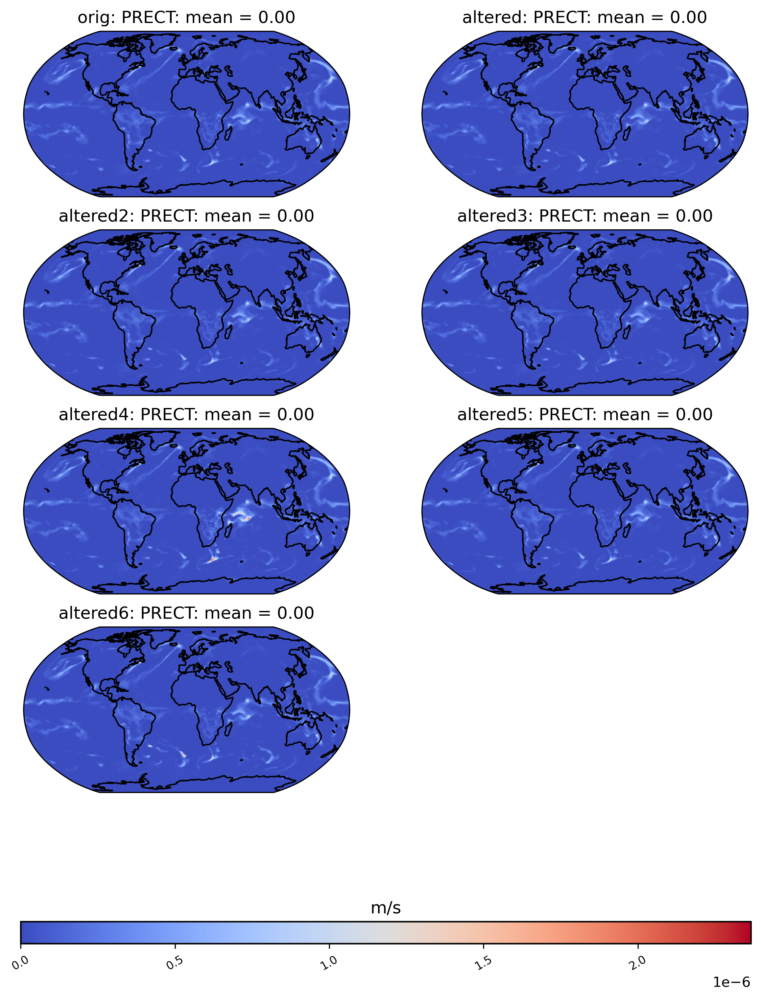

In [51]:
# without weighted means
ldcpy.compare_stats(altered_ds, "PRECT", ["orig", "altered", "altered2", "altered3", "altered4", "altered5", "altered6"], significant_digits=6, weighted=False)

ldcpy.plot(altered_ds, "PRECT", sets=["orig", "altered", "altered2", "altered3", "altered4", "altered5", "altered6"], calc="mean", weighted=False)

# Type Conversion Comparison (Visuals and Metrics)


In [9]:
import xarray as xr
import numpy as np
import dask
da = ds.sel(collection="orig")["PRECT"]

point_altered_da = da.astype(np.double)
point_altered_da2 = da.astype(np.float16)
point_altered_da3 = da.astype(np.short)
point_altered_da4 = da.astype(np.ushort)



da = ds.sel(collection="orig")
altered_ds = ldcpy.collect_datasets("cam-fv", ["PRECT"],
                       [da, point_altered_da.to_dataset(), point_altered_da2.to_dataset(),
                       point_altered_da3.to_dataset(), point_altered_da4.to_dataset(),],
                                  ["orig", "altered", "altered2", "altered3", "altered4"])
altered_ds.attrs["file_size"] = None


dataset size in GB 0.00



Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2,altered3,altered4
mean,2.30521e-08,2.30521e-08,2.12091e-08,0,0
variance,4.61809e-15,4.61809e-15,4.76668e-15,0,0
standard deviation,6.79572e-08,6.79572e-08,6.90418e-08,0,0
min value,-5.74342e-22,-5.74342e-22,0,0,0
max value,1.18318e-06,1.18318e-06,1.19209e-06,0,0
probability positive,0.947609,0.947609,0.16097,0,0
number of zeros,2846,2846,46395,55296,55296
spatial autocorr - latitude,0.816319,0.816319,0.803166,nan,nan
spatial autocorr - longitude,0.85036,0.85036,0.838147,nan,nan
entropy estimate,0.530235,0.530235,0.0186315,0.0010489,0.0010489


,altered,altered2,altered3,altered4
max abs diff,0,2.97984e-08,1.18318e-06,1.18318e-06
min abs diff,0,0,0,0
mean abs diff,0,5.06845e-09,2.30521e-08,2.30521e-08
mean squared diff,0,3.3966e-18,5.31401e-16,5.31401e-16
root mean squared diff,0,9.43218e-09,7.176e-08,7.176e-08
normalized root mean squared diff,0,0.00797191,0.0606503,0.0606503
normalized max pointwise error,0,0.025184,1,1
pearson correlation coefficient,1,0.991006,nan,nan
ks p-value,1,0,0,0
spatial relative error(% > 0.0001),0,94.8423,94.8532,94.8532


2.3052133169208565e-08
2.3052133169208565e-08
2.120914696543305e-08
0.0
0.0


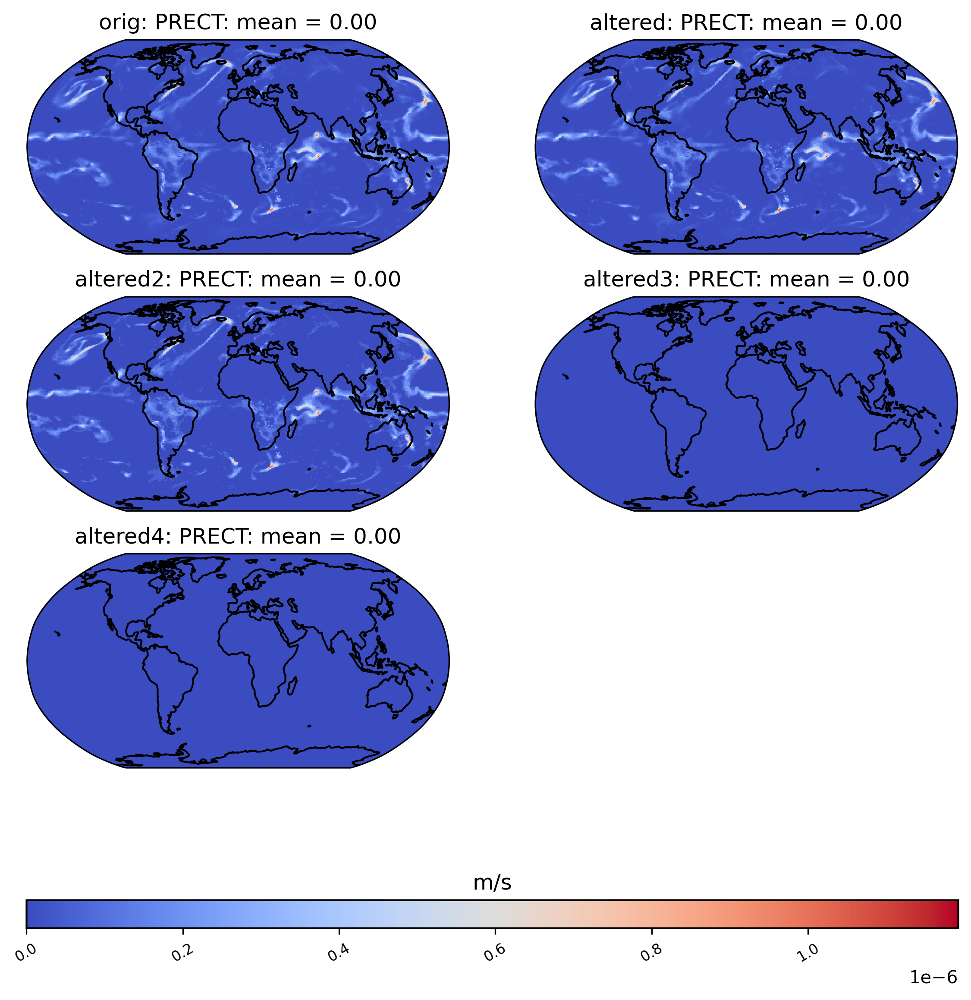

In [10]:
# without weighted means
ldcpy.compare_stats(altered_ds, "PRECT", ["orig", "altered", "altered2", "altered3", "altered4"], significant_digits=6, weighted=False)

ldcpy.plot(altered_ds, "PRECT", sets=["orig", "altered", "altered2", "altered3", "altered4"], calc="mean", weighted=False)

# Round to Zero Comparison (Visuals and Metrics)

In [ ]:
import xarray as xr
import numpy as np
import dask
import dask.array as da

d = ds.sel(collection="orig")["PRECT"]

point_altered_da = d.copy().load()
#point_altered_da[dask.array.where(point_altered_da < 0.001)] = 0

point_altered_da2 = d.copy().load()
point_altered_da2[da.where(abs(point_altered_da2) < np.quantile(abs(point_altered_da2.values), 0.15))] = 0


d = ds.sel(collection="orig")

altered_ds = ldcpy.collect_datasets("cam-fv", ["PRECT"],
                       [d, point_altered_da.to_dataset(), point_altered_da2.to_dataset()],
                                  ["orig", "altered", "altered2"])
altered_ds.attrs["file_size"] = None


Warning - this data set has a time dimension - examining slice 0 only...


,orig,altered,altered2
mean,2.30521e-08,2.30521e-08,2.30521e-08
variance,4.61809e-15,4.61809e-15,4.61809e-15
standard deviation,6.79572e-08,6.79572e-08,6.79572e-08
min value,-5.74342e-22,-5.74342e-22,-5.74342e-22
max value,1.18318e-06,1.18318e-06,1.18318e-06
probability positive,0.947609,0.947609,0.947609
number of zeros,2846,2846,2846
spatial autocorr - latitude,0.816319,0.816319,0.816319
spatial autocorr - longitude,0.85036,0.85036,0.85036
entropy estimate,0.530235,0.530235,0.530235


,altered,altered2
max abs diff,0,0
min abs diff,0,0
mean abs diff,0,0
mean squared diff,0,0
root mean squared diff,0,0
normalized root mean squared diff,0,0
normalized max pointwise error,0,0
pearson correlation coefficient,1,1
ks p-value,1,1
spatial relative error(% > 0.0001),0,0


2.3052133169208565e-08
2.3052133169208565e-08
2.3052133169208565e-08


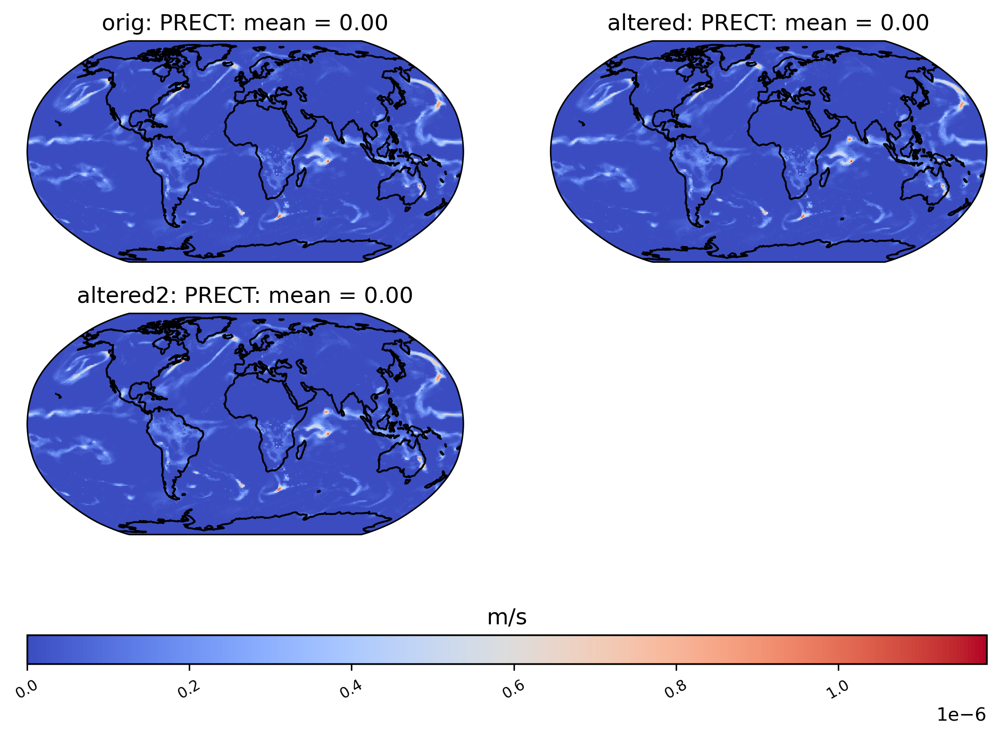

In [19]:
# without weighted means
ldcpy.compare_stats(altered_ds, "PRECT", ["orig", "altered", "altered2"], significant_digits=6, weighted=False)

ldcpy.plot(altered_ds, "PRECT", sets=["orig", "altered", "altered2"], calc="mean", weighted=False)